In [1]:
import os
import numpy as np

In [2]:
class BBox:
    def __init__(self, x, y, r, b, landmark):
        
        self.x = x
        self.y = y
        self.r = r
        self.b = b
        self.landmark = landmark

    def __repr__(self):
        landmark_info = "HasLandmark" if self.landmark else "NoLandmark"
        return f"{{Face {self.x}, {self.y}, {self.r}, {self.b}, {landmark_info} }}"
    
    @property
    def left_top_i(self):
        return int(self.x), int(self.y)
    
    @property
    def right_bottom_i(self):
        return int(self.r), int(self.b)
    
    @property
    def center_i(self):
        return int((self.x + self.r) * 0.5), int((self.y + self.b) * 0.5)
    
    @property
    def center(self):
        return (self.x + self.r) * 0.5, (self.y + self.b) * 0.5
    
    @property
    def width(self):
        return self.r - self.x + 1
    
    @property
    def height(self):
        return self.b - self.y + 1
class ImageObject:
    def __init__(self,file) -> None:
        self.file = file
        self.bboxes = []
    def add(self,annotation):
        x,y,w,h = annotation[:4]
        x = x
        y = y
        r = x + w - 1
        b = y + h - 1
        landmark = None

        if len(annotation)==20:
            landmark = []
            for i in range(5):
                px = annotation[i*3+0+4]
                py = annotation[i*3+1+4]
                pz = annotation[i*3+2+4]

                if pz==-1:
                    landmark = None
                    break
                landmark.append((px,py))
            # landmark = landmark
        self.bboxes.append(BBox(x,y,r,b,landmark))


In [3]:
def load_annotation(anno_file,root_dir):
    with open(anno_file,'r') as f:
        lines = f.readlines()
    images = []
    for line in lines:
        # next_flag = True
        line = line.strip()
        if "#" in line:
            image_path = os.path.join(root_dir,line[2:])
            image_info = ImageObject(image_path)
            images.append(image_info)
        else:
            infos = [float(item) for item in line.split(" ")]
            image_info.add(infos)
    return images


In [4]:
images = load_annotation("./widerface/train/label.txt","./widerface/train/images")
len(images)

12880

In [5]:
images[2].bboxes

[{Face 78.0, 221.0, 84.0, 228.0, NoLandmark },
 {Face 78.0, 238.0, 91.0, 254.0, HasLandmark },
 {Face 113.0, 212.0, 123.0, 226.0, HasLandmark },
 {Face 134.0, 260.0, 148.0, 274.0, HasLandmark },
 {Face 163.0, 250.0, 176.0, 266.0, HasLandmark },
 {Face 201.0, 218.0, 210.0, 229.0, HasLandmark },
 {Face 182.0, 266.0, 196.0, 282.0, HasLandmark },
 {Face 245.0, 279.0, 262.0, 293.0, HasLandmark },
 {Face 304.0, 265.0, 319.0, 281.0, HasLandmark },
 {Face 328.0, 295.0, 343.0, 314.0, HasLandmark },
 {Face 389.0, 281.0, 405.0, 299.0, HasLandmark },
 {Face 406.0, 293.0, 426.0, 313.0, HasLandmark },
 {Face 436.0, 290.0, 457.0, 306.0, HasLandmark },
 {Face 522.0, 328.0, 542.0, 345.0, HasLandmark },
 {Face 643.0, 320.0, 665.0, 341.0, HasLandmark },
 {Face 653.0, 224.0, 669.0, 248.0, HasLandmark },
 {Face 793.0, 337.0, 815.0, 366.0, HasLandmark },
 {Face 535.0, 311.0, 550.0, 327.0, HasLandmark },
 {Face 29.0, 220.0, 39.0, 234.0, HasLandmark },
 {Face 3.0, 232.0, 13.0, 246.0, HasLandmark },
 {Face 20.

In [6]:
image = images[0]

In [7]:
image.file

'./widerface/train/images/0--Parade/0_Parade_marchingband_1_849.jpg'

In [8]:
import cv2
import matplotlib.pyplot as plt

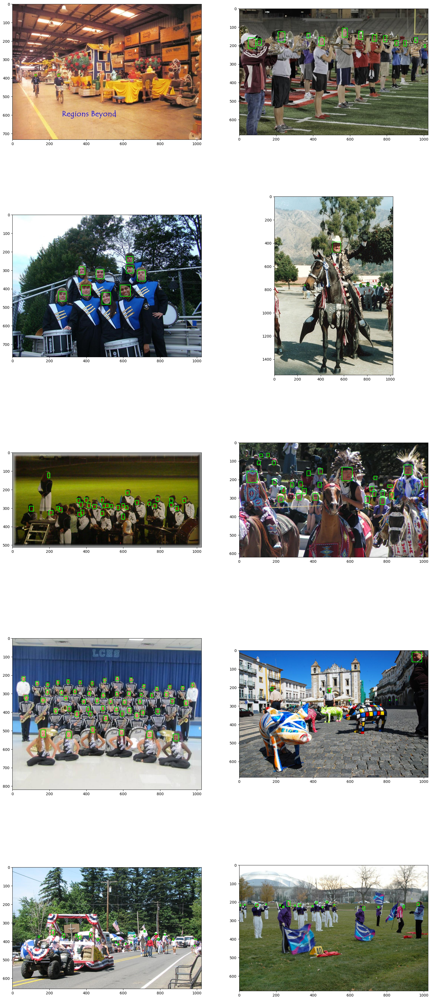

In [9]:
plt.figure(figsize=(20, 50))

for i in range(20, 30):
    plt.subplot(5, 2, i-20+1)
    
    image = images[i]
    cvimage = cv2.imread(image.file)
    
    for box in image.bboxes:
        cv2.rectangle(cvimage, box.left_top_i, box.right_bottom_i, (0, 255, 0), 2)
        
        if box.landmark:
            for x, y in box.landmark:
                cv2.circle(cvimage, (int(x), int(y)), 1, (0, 0, 255), -1, 16)
    
    plt.imshow(cvimage[..., ::-1])

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init

def conv3x3_bn_relu(in_feature, out_feature, stride=1, relu=True, groups=1):
    modules = [
        nn.Conv2d(in_feature, out_feature, kernel_size=3, stride=stride, padding=1, groups=groups, bias=False),
        nn.BatchNorm2d(out_feature)
    ]
    
    if relu:
        modules.append(nn.ReLU(inplace=True))
    return nn.Sequential(*modules)

def conv1x1_bn_relu(in_feature, out_feature, stride=1, relu=True):
    modules = [
        nn.Conv2d(in_feature, out_feature, kernel_size=1, stride=stride, bias=False),
        nn.BatchNorm2d(out_feature)
    ]
    
    if relu:
        modules.append(nn.ReLU(inplace=True))
    return nn.Sequential(*modules)

class BasicBlock(nn.Module):
    expansion = 1   # 膨胀系数
    
    def __init__(self, in_feature, planes, stride=1, groups=1, width_per_group=64):
        super().__init__()
        
        assert groups == 1 and width_per_group == 64, f"{groups} == 1 and {width_per_group} == 64"
        self.conv1 = conv3x3_bn_relu(in_feature, planes, stride=stride)
        self.conv2 = conv3x3_bn_relu(planes, planes * self.expansion, relu=False)
        self.relu = nn.ReLU(inplace=True)
        
        # 如果有下采样
        if stride != 1 or in_feature != planes * self.expansion:
            self.shortcut = conv1x1_bn_relu(in_feature, planes * self.expansion, stride=stride, relu=False)
        else:
            self.shortcut = nn.Identity()
        
    def forward(self, x):
        identity = x
        x = self.conv1(x)
        x = self.conv2(x)
        x = x + self.shortcut(identity)
        return self.relu(x)

class BottleneckBlock(nn.Module):
    expansion = 4  # 膨胀系数
    
    def __init__(self, in_feature, planes, stride=1, groups=1, width_per_group=64):
        super().__init__()

        #width = (planes * width_per_group) // 64 * groups
        coeff = planes // 64
        width = coeff * width_per_group * groups
        self.conv1 = conv1x1_bn_relu(in_feature, width)
        self.conv2 = conv3x3_bn_relu(width, width, stride=stride, groups=groups)
        self.conv3 = conv1x1_bn_relu(width, planes * self.expansion, relu=False)
        
        # 1x1的卷积，通常会用来改变通道数，并使得通道一致，或者达成某种目的。促使目的完成
        # 目的指，比如说add操作，a、b操作数，是不是得要求a和b具有完全一样的大小和通道数
        # 1x1卷积去搞
        if stride != 1 or in_feature != planes * self.expansion:
            # 需要做映射
            self.shortcut = conv1x1_bn_relu(in_feature, planes * self.expansion, stride=stride, relu=False)
        else:
            self.shortcut = nn.Identity()
        
    def forward(self, x):
        identity = x
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        out = x + self.shortcut(identity)
        return F.relu(out, inplace=True)


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, groups=1, width_per_group=64):
        super().__init__()
        
        self.in_feature = 64
        self.num_blocks = num_blocks
        self.block = block
        self.groups = groups
        self.width_per_group = width_per_group
        self.layer0 = nn.Sequential(
            nn.Conv2d(3, self.in_feature, kernel_size=7, padding=3, stride=2, bias=False),
            nn.BatchNorm2d(self.in_feature),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        )
        self.layer1 = self.make_layer(planes=64, stride=1, num_block=self.num_blocks[0])
        self.layer2 = self.make_layer(planes=128, stride=2, num_block=self.num_blocks[1])
        self.layer3 = self.make_layer(planes=256, stride=2, num_block=self.num_blocks[2])
        self.layer4 = self.make_layer(planes=512, stride=2, num_block=self.num_blocks[3])

        
    def make_layer(self, planes, stride, num_block):
        
        modules = [
            self.block(self.in_feature, planes=planes, stride=stride, groups=self.groups, width_per_group=self.width_per_group)
        ]
        
        self.in_feature = planes * self.block.expansion
        
        for i in range(num_block-1):
            modules.append(
                self.block(self.in_feature, planes=planes, groups=self.groups, width_per_group=self.width_per_group)
            )
        return nn.Sequential(*modules)

    def forward(self, x):
        x = self.layer0(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        return x

def resnet18():
    return ResNet(BasicBlock, [2, 2, 2, 2])

/home/zhanggong/miniconda3/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [11]:
def upmodule(in_feature, out_feature, scale=2):
    # Upsample + Conv + BN
    return nn.Sequential(
        nn.Upsample(scale_factor=scale, mode="nearest"),
        nn.Conv2d(in_feature, out_feature, kernel_size=3, padding=1, stride=1, bias=False),
        nn.BatchNorm2d(out_feature)
    )

In [12]:
def upmodule_conv_transpose(in_feature, out_feature):
    
    # n + n - 1
    # dilation * (k - 1)
    # (n - 1) * stride - 2 * padding + dilation * (k - 1) + op + 1
    return nn.Sequential(
        nn.ConvTranspose2d(in_feature, out_feature, kernel_size=2, stride=2, padding=0, bias=False),
        nn.BatchNorm2d(out_feature),
        nn.ReLU(),
        nn.Conv2d(out_feature, out_feature, kernel_size=1, padding=0, stride=1, bias=False),
        nn.BatchNorm2d(out_feature)
    )

In [13]:
def projection_module(in_feature, out_feature):
    # Conv + BN
    return nn.Sequential(
        nn.Conv2d(in_feature, out_feature, kernel_size=1, padding=0, stride=1, bias=False),
        nn.BatchNorm2d(out_feature)
    )

In [14]:
def head_module(in_feature, out_feature, init):
    
    head = nn.Conv2d(in_feature, out_feature, kernel_size=1, stride=1, padding=0)
    init(head)
    
    return nn.Sequential(
        nn.Conv2d(in_feature, in_feature, kernel_size=3, stride=1, padding=1),
        nn.ReLU(),
        head
    )

In [15]:
class Detection(nn.Module):
    def __init__(self,deploy=False):
        super().__init__()
        
        model = resnet18()
        self.layer0 = model.layer0  # 4     c=64
        self.layer1 = model.layer1  # 4     c=64
        self.layer2 = model.layer2  # 8     c=128
        self.layer3 = model.layer3  # 16    c=256
        self.layer4 = model.layer4  # 32    c=512
        self.deploy = deploy
        
        wide = 24
        self.u4 = upmodule_conv_transpose(512, wide)
        self.p3 = projection_module(256, wide)
        
        self.u3 = upmodule_conv_transpose(wide, wide)
        self.p2 = projection_module(128, wide)
        
        self.u2 = upmodule_conv_transpose(wide, wide)
        self.p1 = projection_module(64, wide)
        
        self.point = head_module(wide, 1, self.point_head_init)
        self.offset = head_module(wide,2,self.coordinate_init)
        self.coordinate = head_module(wide, 2, self.coordinate_init)
        
    def point_head_init(self, m):
        torch.nn.init.normal_(m.weight, std=0.001)
        torch.nn.init.constant_(m.bias, -2.9444389791664403)
        
    def coordinate_init(self, m):
        torch.nn.init.normal_(m.weight, std=0.001)
        torch.nn.init.constant_(m.bias, 0)
        
    def forward(self, x):
        x0 = self.layer0(x)
        x1 = self.layer1(x0)
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        
        u4 = self.u4(x4)
        p3 = self.p3(x3)
        o4 = F.relu(u4 + p3)  # 16倍
        
        u3 = self.u3(o4)
        p2 = self.p2(x2)
        o3 = F.relu(u3 + p2)  # 8倍
        
        u2 = self.u2(o3)
        p1 = self.p1(x1)
        o2 = F.relu(u2 + p1)  # 4倍
        point = self.point(o2)
        offset = self.offset(o2)
        wh = self.coordinate(o2)
        if self.deploy:
            point = point.sigmoid()
            point = point.permute(0,2,3,1).contiguous().view(-1,1)
            offset = offset.permute(0,2,3,1).contiguous().view(-1,2)
            wh = wh.permute(0,2,3,1).contiguous().view(-1,2)
            print(point.shape)
            print(offset.shape)
            print(wh.shape)
            return torch.cat([point,offset,wh],-1)
        return point, offset,wh

In [16]:
# model = Detection()
# torch.onnx.export(model, (torch.zeros(1, 3, 768, 1024),), "detection.onnx", opset_version=11)

In [17]:
import torchvision.transforms.functional as T
image = images[22]
cvimage = cv2.imread(image.file)
h, w, _ = cvimage.shape
torch_image = T.to_tensor(cvimage).unsqueeze(0).cuda()
torch_image.shape

torch.Size([1, 3, 768, 1024])

In [18]:
image.file

'./widerface/train/images/0--Parade/0_Parade_marchingband_1_483.jpg'

In [19]:
def draw_gauss(heatmap, x, y, gsize):
    
    height, width = heatmap.shape[:2]
    gsize += 1 - (gsize % 2)
    sigma = gsize / 6
    s = 2 * sigma * sigma
    radius = gsize // 2
    ky, kx = np.ogrid[-radius:+radius+1, -radius:+radius+1]
    kernel = np.exp(-(kx * kx + ky * ky) / s)
    
    dleft, dtop = -min(x, radius), -min(y, radius)
    dright, dbottom = +min(width - x, radius+1), +min(height - y, radius+1)
    select_heatmap = heatmap[y+dtop:y+dbottom, x+dleft:x+dright]
    select_kernel = kernel[radius+dtop:radius+dbottom, radius+dleft:radius+dright]
    if min(select_heatmap.shape) > 0:
        np.maximum(select_heatmap, select_kernel, out=select_heatmap)
    return heatmap

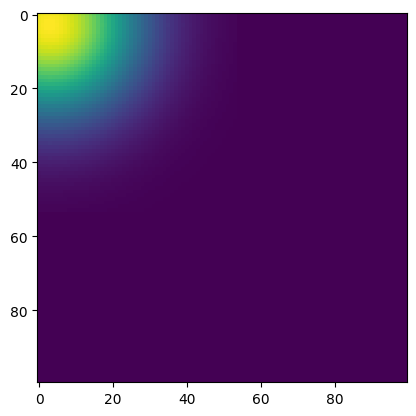

In [20]:

import matplotlib.pyplot as plt
heatmap = np.zeros((100, 100))
draw_gauss(heatmap, 3, 3, 100)
plt.imshow(heatmap)

In [21]:
stride = 4
gt_heatmap = np.zeros((h // stride, w // stride), dtype=np.float32)
for box in image.bboxes:
    x,y = box.center_i
    gsize = int(min(box.width, box.height))
    draw_gauss(gt_heatmap,x//stride,y//stride,gsize//stride)
torch_point_target = torch.as_tensor(gt_heatmap)[None, None].cuda()
torch_point_target.shape
# plt.imshow(gt_heatmap)

torch.Size([1, 1, 192, 256])

In [22]:
stride = 4
h, w, _ = cvimage.shape
gt_wh_heatmap = np.zeros((2, h // stride, w // stride), dtype=np.float32)
gt_mask_heatmap = np.zeros((2, h // stride, w // stride), dtype=np.bool)
gt_offset_heatmap = np.zeros((2, h // stride, w // stride), dtype=np.float32)
for box in image.bboxes:
    center_x,center_y = box.center
    norm_width,norm_height = box.width/stride,box.height/stride
    cell_x,cell_y = int(center_x//stride),int(center_y//stride)

    offset_x = center_x/stride-cell_x
    offset_y = center_y/stride-cell_y

    gt_mask_heatmap[:, cell_y, cell_x] = True
    gt_wh_heatmap[0, cell_y, cell_x] = norm_width
    gt_wh_heatmap[1, cell_y, cell_x] = norm_height

    gt_offset_heatmap[0, cell_y, cell_x] = offset_x
    gt_offset_heatmap[1, cell_y, cell_x] = offset_y
torch_wh_target = torch.as_tensor(gt_wh_heatmap)[None].cuda()
torch_wh_target.shape
torch_mask_target = torch.as_tensor(gt_mask_heatmap)[None].cuda()
torch_mask_target.shape
torch_offset_target = torch.as_tensor(gt_offset_heatmap)[None].cuda()
# print(torch_offset_heatmap)

/home/zhanggong/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


In [23]:
torch_offset_target.shape

torch.Size([1, 2, 192, 256])

In [24]:
def smooth_l1_loss_modify(predict,target,mask,sigma=3):
    # predict: bx2x96x128
    # target : bx2x96x128
    # mask   : bx2x96x128
    num_object = mask.sum().item()/mask.size(1)
    sigma2 = sigma*sigma
    diff = predict[mask]-target[mask]
    diff_abs = diff.abs()
    near = (diff_abs<1/sigma2).float()
    far = 1-near
    loss = (near*0.5*sigma2*torch.pow(diff,2)+(diff_abs - 0.5 / sigma2)).sum() / num_object
    return loss

In [25]:
class GIoULoss(nn.Module):
    def __init__(self):
        super().__init__()
        
    def forward(self, A, B):
        num_bbox = A.size(0) * A.size(2)
        ax, ay, ar, ab = A[:, 0], A[:, 1], A[:, 2], A[:, 3]
        bx, by, br, bb = B[:, 0], B[:, 1], B[:, 2], B[:, 3]
        xmax = torch.min(ar, br)
        ymax = torch.min(ab, bb)
        xmin = torch.max(ax, bx)
        ymin = torch.max(ay, by)
        cross_width = (xmax - xmin + 1).clamp(0)
        cross_height = (ymax - ymin + 1).clamp(0)
        cross = cross_width * cross_height
        union = (ar - ax + 1) * (ab - ay + 1) + (br - bx + 1) * (bb - by + 1) - cross
        iou = cross / union
        cxmin = torch.min(ax, bx)
        cymin = torch.min(ay, by)
        cxmax = torch.max(ar, br)
        cymax = torch.max(ab, bb)
        c = (cxmax - cxmin + 1) * (cymax - cymin + 1)
        return (1 - (iou - (c - union) / c)).sum() / num_bbox

In [26]:
class FocalLoss(nn.Module):
    def __init__(self):
        super().__init__()
        
    def forward(self, predict, target):
        alpha = 2
        beta = 4
        positive_mask = target.eq(1).float()
        positive_loss = torch.pow((1 - predict), alpha) * torch.log(predict) * positive_mask
        negative_loss = torch.pow((1 - target), beta) * torch.pow(predict, alpha) * torch.log(1 - predict)
        N = positive_mask.sum()
        if N == 0: N = 1
        return -1 / N * (positive_loss + negative_loss).sum()

In [27]:
feature_map_height, feature_map_width = h // stride, w // stride
cell_y_grid, cell_x_grid = torch.meshgrid(torch.arange(feature_map_height), torch.arange(feature_map_width))
cell_offset_grid = torch.stack([cell_x_grid, cell_y_grid, cell_x_grid, cell_y_grid])[None]
#torch.where(torch_mask_target[0, 0] == 1)
cell_offset_grid.shape

torch.Size([1, 4, 192, 256])

In [28]:
cell_offset_grid

tensor([[[[  0,   1,   2,  ..., 253, 254, 255],
          [  0,   1,   2,  ..., 253, 254, 255],
          [  0,   1,   2,  ..., 253, 254, 255],
          ...,
          [  0,   1,   2,  ..., 253, 254, 255],
          [  0,   1,   2,  ..., 253, 254, 255],
          [  0,   1,   2,  ..., 253, 254, 255]],

         [[  0,   0,   0,  ...,   0,   0,   0],
          [  1,   1,   1,  ...,   1,   1,   1],
          [  2,   2,   2,  ...,   2,   2,   2],
          ...,
          [189, 189, 189,  ..., 189, 189, 189],
          [190, 190, 190,  ..., 190, 190, 190],
          [191, 191, 191,  ..., 191, 191, 191]],

         [[  0,   1,   2,  ..., 253, 254, 255],
          [  0,   1,   2,  ..., 253, 254, 255],
          [  0,   1,   2,  ..., 253, 254, 255],
          ...,
          [  0,   1,   2,  ..., 253, 254, 255],
          [  0,   1,   2,  ..., 253, 254, 255],
          [  0,   1,   2,  ..., 253, 254, 255]],

         [[  0,   0,   0,  ...,   0,   0,   0],
          [  1,   1,   1,  ...,   1, 

Iter: 0, Loss: 9.038, Point: 3.398, Coordinate: 0.861, wh:23.890


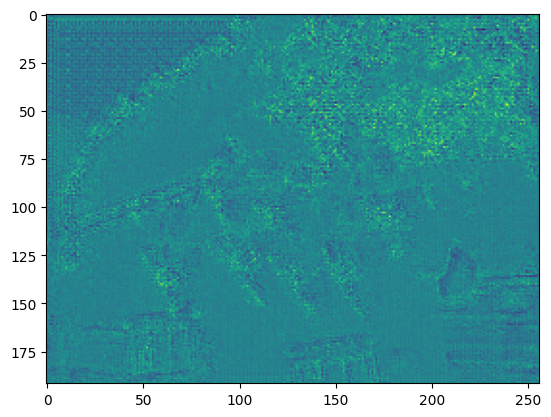

Iter: 50, Loss: 0.178, Point: 0.021, Coordinate: -0.067, wh:1.115


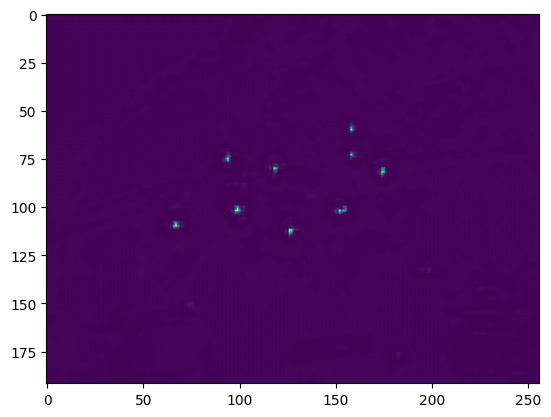

Iter: 100, Loss: 0.088, Point: 0.005, Coordinate: -0.084, wh:0.830


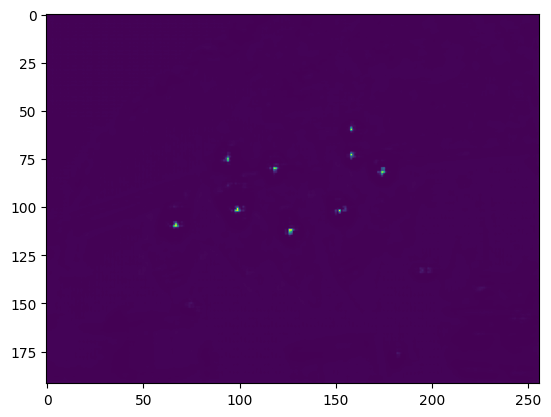

Iter: 150, Loss: 0.035, Point: 0.004, Coordinate: -0.029, wh:0.302


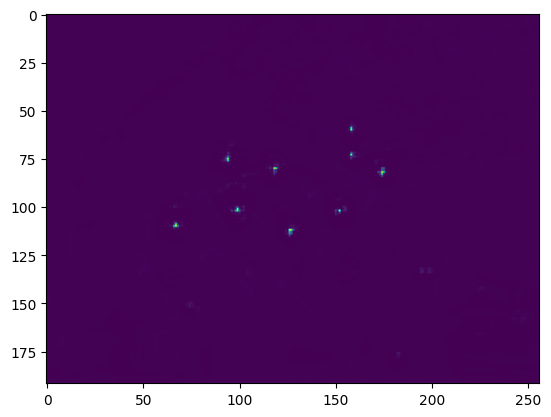

In [29]:
model = Detection().cuda()
model.train()

glr = 1e-3
optim = torch.optim.Adam(model.parameters(), glr)  #, momentum=0.9
iters = 200
coordinate_loss_function = smooth_l1_loss_modify
point_loss_function = FocalLoss().cuda()
#dwa = DWA(2)

for niter in range(iters):
    predict_point, predict_coordinate,pre_wh = model(torch_image)
    predict_point = predict_point.sigmoid()
    predict_point = predict_point.clamp(1e-4, 1-1e-4)

    point_loss = point_loss_function(predict_point, torch_point_target)
    
    coordinate_loss = coordinate_loss_function(predict_coordinate, torch_offset_target,torch_mask_target)

    wh_loss = coordinate_loss_function(pre_wh,torch_wh_target,torch_mask_target)
    loss = point_loss + coordinate_loss+0.2*wh_loss
    #dwa.push(point_loss.item(), coordinate_loss.item())
    
    optim.zero_grad()
    loss.backward()
    optim.step()
     
   
    
    if niter % 50 == 0:
        print("Iter: {}, Loss: {:.3f}, Point: {:.3f}, Coordinate: {:.3f}, wh:{:.3f}".format(
        niter, loss.item(), point_loss.item(), coordinate_loss.item(),wh_loss.item()
    ))
        plt.imshow(predict_point[0, 0].data.cpu().numpy())
        plt.show()
torch.save(model.state_dict(),'end.pth')

In [30]:
model.eval()
with torch.no_grad():
    predict_point, predict_coordinate,pre_wh = model(torch_image)
    predict_point = predict_point.sigmoid()
    predict_point = predict_point.cpu()
    predict_coordinate = predict_coordinate.cpu()
    pre_wh = pre_wh.cpu()

In [31]:
pre_wh.shape

torch.Size([1, 2, 192, 256])

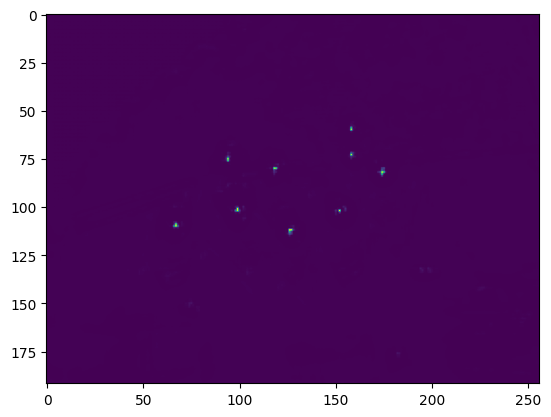

In [32]:
plt.imshow(predict_point.data.numpy()[0, 0])

In [33]:
import torch.nn.functional as F

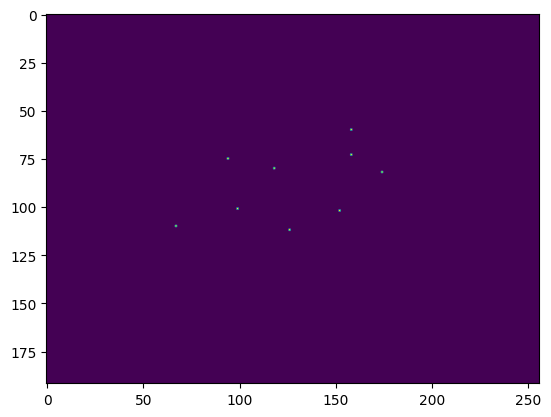

In [34]:
pool_predict_point = F.max_pool2d(predict_point,kernel_size=3,padding=1, stride=1)
plt.imshow(pool_predict_point.data.numpy()[0, 0])
select_nms_mask = pool_predict_point.eq(predict_point)&(predict_point>0.5)
plt.imshow(select_nms_mask.data.numpy()[0, 0])

In [35]:
predict_coordinate.shape

torch.Size([1, 2, 192, 256])

tensor(60) tensor(158)
tensor(73) tensor(158)
tensor(75) tensor(94)
tensor(80) tensor(118)
tensor(82) tensor(174)
tensor(101) tensor(99)
tensor(102) tensor(152)
tensor(110) tensor(67)
tensor(112) tensor(126)


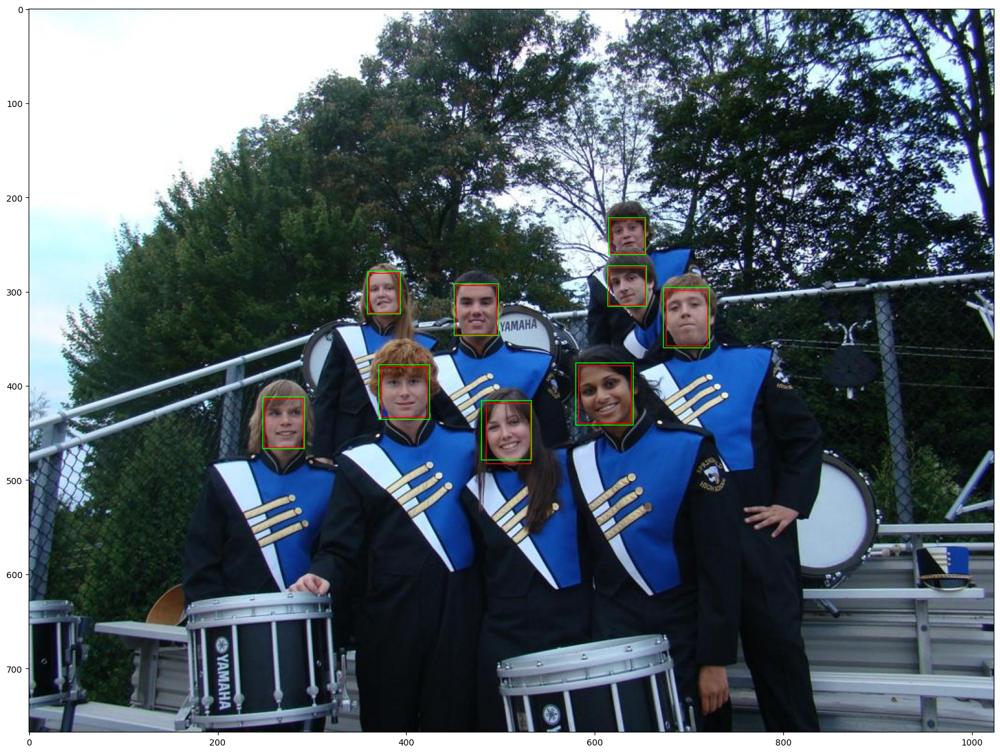

In [36]:
position_y, position_x = torch.where(select_nms_mask[0, 0] == 1)
show = cvimage.copy()
for box in image.bboxes:
    cv2.rectangle(show, box.left_top_i, box.right_bottom_i, (0, 0, 255), 1)
for y,x in zip(position_y,position_x):
    cx = (x+predict_coordinate[...,0,y,x].data.numpy())*stride
    cy = (y+predict_coordinate[...,1,y,x].data.numpy())*stride
    print(y,x)


    w_p,h_p = pre_wh[...,y,x].data.numpy()[0]*stride
    bx = int(cx-0.5*w_p)
    by = int(cy-0.5*h_p)
    br = int(cx+0.5*w_p)
    bb = int(cy+0.5*h_p)
    # bx = int((x + dx) * stride + 0.5)
    # by = int((y + dy) * stride + 0.5)
    # br = int((x + dr) * stride + 0.5)
    # bb = int((y + db) * stride + 0.5)

    cv2.rectangle(show, (bx, by), (br, bb), (0, 255, 0), 1)
    #cv2.circle(show, (image_px, image_py), 20, (0, 255, 0), 2, 16)

plt.figure(figsize=(20, 20))
plt.imshow(show[..., ::-1])

In [37]:
predict_coord.shape

NameError: name 'predict_coord' is not defined

1. 数据处理部分  
    确定输出：  
        (1)中心点->n 1 w h  
        (2)中心点偏移量->n 2 w h  
        (3)w,h->n 2 w h  
        (4)mask用于定位正样本 n 2 w h  
2. 网络结果部分：  
    backbone:resnet18  
    neck:FPN  
    head:  
        (1)中心点head 
        (2)中心点偏移量head
        (3)wh head
3. loss部分  
    (1)中心点是分类任务->focal loss softmax   
    (2)中心点偏移量 smooth l1  
    (2)wh 采用smooth l1 或者giou loss  
4. 推理解码部分  
    (1) 中心点+偏移量->中心  
    (2) 对中心进行非极大值抑制-> maxpool思想  
    (2) w,h  

In [39]:
onnx_model = Detection(True)
onnx_model.eval()
onnx_model.load_state_dict(torch.load('end.pth',map_location='cpu'))
torch.onnx.export(onnx_model, torch_image.cpu(),"detection.onnx", opset_version=11,input_names=["data"],output_names=["ouput"],dynamic_axes=None)

/home/zhanggong/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:61: TracerWarning: Converting a tensor to a Python integer might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
/home/zhanggong/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:62: TracerWarning: Converting a tensor to a Python integer might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
/home/zhanggong/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:63: TracerWarning: Converting a tensor to a Python integer might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace 

torch.Size([49152, 1])
torch.Size([49152, 2])
torch.Size([49152, 2])


In [43]:
onnx_model(torch_image.cpu())[1]

torch.Size([49152, 1])
torch.Size([49152, 2])
torch.Size([49152, 2])


tensor([0.0059, 0.0296, 0.0258, 0.3929, 0.4576], grad_fn=<SelectBackward>)

In [ ]:
torch_image

tensor([[[[0.9922, 0.9922, 0.9922,  ..., 0.4392, 0.5922, 0.6667],
          [0.9922, 0.9922, 0.9922,  ..., 0.7725, 0.8745, 1.0000],
          [0.9922, 0.9922, 0.9922,  ..., 1.0000, 0.9765, 1.0000],
          ...,
          [0.1529, 0.1294, 0.1176,  ..., 0.4392, 0.4353, 0.4353],
          [0.1451, 0.1216, 0.1098,  ..., 0.4902, 0.4863, 0.4863],
          [0.1451, 0.1176, 0.1059,  ..., 0.5137, 0.5098, 0.5098]],

         [[0.9961, 0.9961, 0.9961,  ..., 0.1725, 0.2667, 0.3176],
          [0.9961, 0.9961, 0.9961,  ..., 0.5373, 0.6078, 0.7216],
          [0.9961, 0.9961, 0.9961,  ..., 0.9059, 0.8235, 0.8471],
          ...,
          [0.1804, 0.1569, 0.1333,  ..., 0.3765, 0.3725, 0.3725],
          [0.1804, 0.1569, 0.1373,  ..., 0.4275, 0.4235, 0.4235],
          [0.1843, 0.1569, 0.1412,  ..., 0.4510, 0.4471, 0.4471]],

         [[0.9569, 0.9569, 0.9569,  ..., 0.0824, 0.1843, 0.2353],
          [0.9569, 0.9569, 0.9569,  ..., 0.4510, 0.5176, 0.6275],
          [0.9608, 0.9608, 0.9608,  ..., 0

In [1]:
import numpy as np
import torch

import torch.nn.functional as F

In [2]:
a=torch.Tensor([1,5,3,0.5,0.9])
b=torch.Tensor([4,1,0,0.4,0.2])

In [3]:
loss1=F.smooth_l1_loss(a,b)

In [4]:
loss1

tensor(1.7500)

In [5]:
loss_part1=torch.abs(a-b)#|x-y|
loss_part2=loss_part1**2
loss_part2=loss_part2*0.50
loss2=torch.where(loss_part1>=1,loss_part1-0.5,loss_part2)
loss2=torch.mean(loss2)
print(loss1)
print(loss2)

tensor(1.7500)
tensor(1.7500)
